In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
data_dir = "/content/drive/MyDrive/Paddy_Dataset/Deficiencies/"
img_size = (224, 224)
batch_size = 32

In [ ]:
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

In [ ]:
train_data = datagen.flow_from_directory(
    data_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="training"
)

val_data = datagen.flow_from_directory(
    data_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation"
)

Found 2340 images belonging to 4 classes.
Found 581 images belonging to 4 classes.


In [ ]:
print("Class Indices:", train_data.class_indices)

Class Indices: {'Nitrogen_Deficiency': 0, 'Normal': 1, 'Phosphorus_Deficiency': 2, 'Potassium_Deficiency': 3}


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam

In [ ]:
base_model = MobileNetV3Large(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

12683000/12683000 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
base_model.trainable = False

In [ ]:
model = Sequential([
    base_model,
    Flatten(),
    Dense(512, activation='relu'),
    Dense(4, activation='softmax')
])

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
epochs = 10
history = model.fit(train_data,
                    validation_data=val_data,
                    epochs=epochs)

Epoch 1/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 1260s 17s/step - accuracy: 0.6820 - loss: 2.2910 - val_accuracy: 0.7952 - val_loss: 0.5796
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 17s 232ms/step - accuracy: 0.8236 - loss: 0.4026 - val_accuracy: 0.7969 - val_loss: 0.5610
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 17s 231ms/step - accuracy: 0.8443 - loss: 0.3689 - val_accuracy: 0.8158 - val_loss: 0.4213
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 18s 246ms/step - accuracy: 0.8499 - loss: 0.3572 - val_accuracy: 0.8296 - val_loss: 0.3676
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 17s 231ms/step - accuracy: 0.8840 - loss: 0.2787 - val_accuracy: 0.8244 - val_loss: 0.4125
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 17s 233ms/step - accuracy: 0.8848 - loss: 0.2693 - val_accuracy: 0.8141 - val_loss: 0.4492
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 18s 241ms/step - accuracy: 0.8979 - loss: 0.2411 - val_accuracy: 0.8365 - val_loss: 0.3870
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 20s 230ms/step - accuracy: 0.9024 - loss: 0.2462 - val_accu

In [ ]:
model.save("/content/drive/MyDrive/Def_Model.keras")

In [ ]:
import os
import tensorflow as tf
import numpy as np
from PIL import Image
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
model_path = "/content/drive/MyDrive/Def_Model.keras"
model = tf.keras.models.load_model(model_path)
print(model.summary())

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ MobileNetV3Large (Functional)        │ (None, 7, 7, 960)           │       2,996,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 47040)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │      24,084,992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 4)                   │           2,052 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 75,257,486 (287.08 MB)

 Trainable params: 24,087,044 (91.88 MB)

 Non-trainable params: 2,996,352 (11.43 MB)

 Optimizer params: 48,174,090 (183.77 MB)

None


In [ ]:
# Class Labels Mapping
class_names = ['Nitrogen_Deficiency', 'Normal','Phosphorus_Deficiency','Potassium_Deficiency']


In [ ]:
test_dir = "/content/drive/MyDrive/Paddy_Dataset/Deficiencies/"

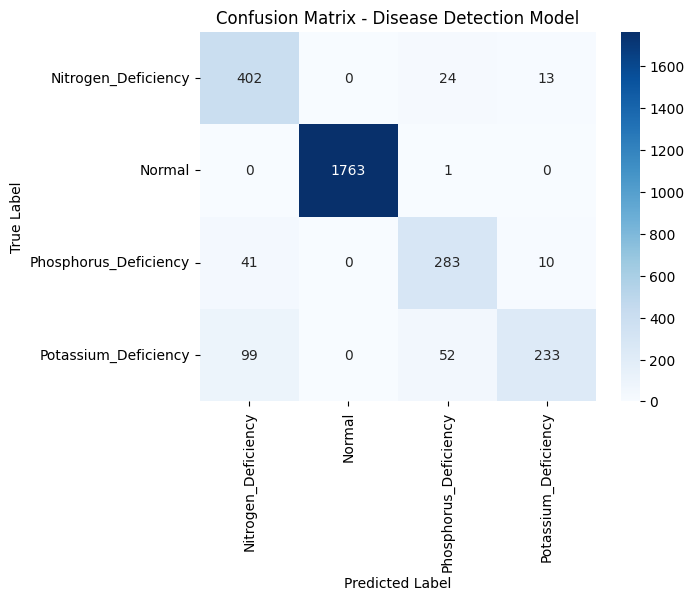

In [ ]:
def preprocess_image(image_path):
    image = Image.open(image_path).resize((224, 224))
    image = np.array(image) / 255.0
    return np.expand_dims(image, axis=0)

true_labels, pred_labels = [], []

for class_index, disease in enumerate(class_names):
    disease_folder = os.path.join(test_dir, disease)
    if not os.path.exists(disease_folder):
        continue
    for image_name in os.listdir(disease_folder):
        if image_name.endswith((".jpg", ".png", ".jpeg")):
            image_path = os.path.join(disease_folder, image_name)
            image = preprocess_image(image_path)
            predicted_class = np.argmax(model.predict(image, verbose=0))
            true_labels.append(class_index)
            pred_labels.append(predicted_class)

# Generate and display Confusion Matrix
cm = confusion_matrix(true_labels, pred_labels)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Disease Detection Model")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
Predicted Disease: Nitrogen_Deficiency
Confidence: 91.69999694824219%


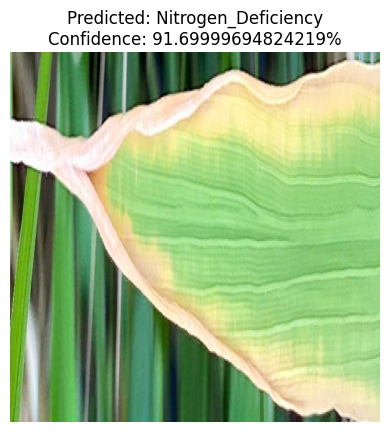

In [ ]:
import tensorflow as tf

# Load the trained model
model_path = "/content/drive/MyDrive/Def_Model.keras"
model = tf.keras.models.load_model(model_path)

class_names = ['Nitrogen_Deficiency', 'Normal','Phosphorus_Deficiency','Potassium_Deficiency']
import numpy as np
from PIL import Image

def preprocess_image(image_path):
    """Load and preprocess an image."""
    image = Image.open(image_path)
    image = image.resize((224, 224))  # Resize to model input size
    image = np.array(image) / 255.0  # Normalize pixel values
    return np.expand_dims(image, axis=0)  # Add batch dimension
import matplotlib.pyplot as plt

# Test image path (change this to your test image)
test_image_path = "/content/drive/MyDrive/N1.jpg"

# Preprocess and predict
image = preprocess_image(test_image_path)
predictions = model.predict(image)
predicted_class = np.argmax(predictions)
confidence = round(100 * np.max(predictions), 2)

# Output result
print(f"Predicted Disease: {class_names[predicted_class]}")
print(f"Confidence: {confidence}%")



# Display Image
plt.imshow(Image.open(test_image_path))
plt.axis("off")
plt.title(f"Predicted: {class_names[predicted_class]}\nConfidence: {confidence}%")
plt.show()




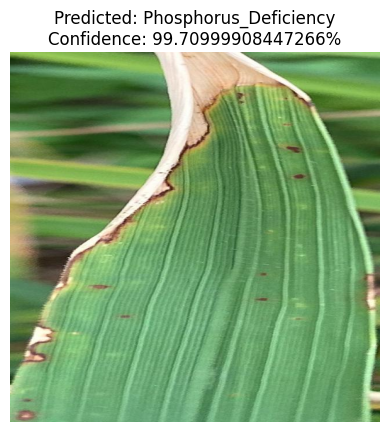

Image: K_1.jpg
Predicted Disease: Phosphorus_Deficiency
Confidence: 99.70999908447266%
Precaution: No information available.
--------------------------------------------------


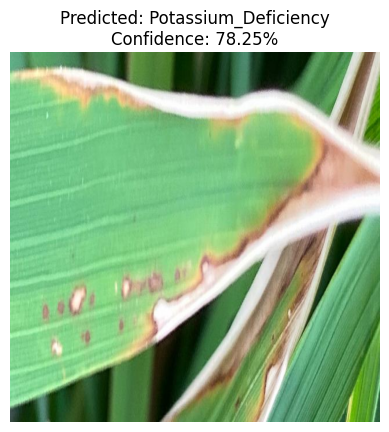

Image: K_2.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 78.25%
Precaution: No information available.
--------------------------------------------------


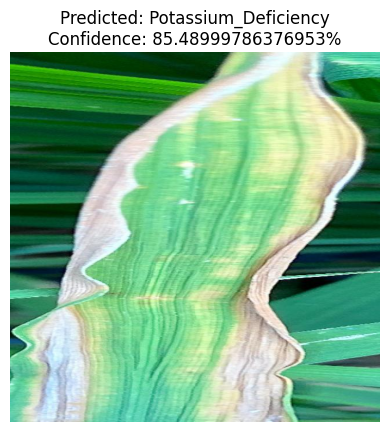

Image: K_3.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 85.48999786376953%
Precaution: No information available.
--------------------------------------------------


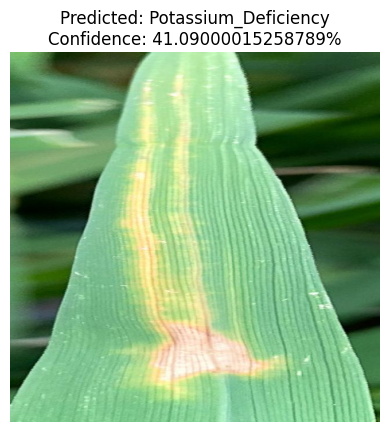

Image: K_4.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 41.09000015258789%
Precaution: No information available.
--------------------------------------------------


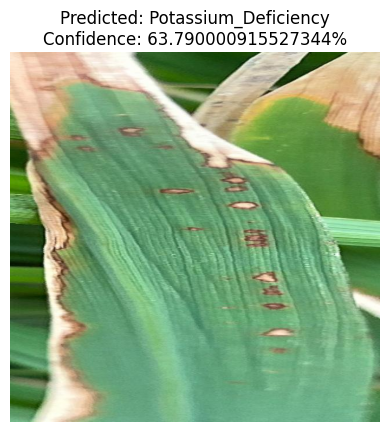

Image: K_5.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 63.790000915527344%
Precaution: No information available.
--------------------------------------------------


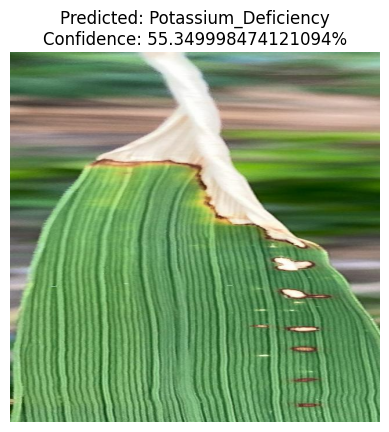

Image: K_6.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 55.349998474121094%
Precaution: No information available.
--------------------------------------------------


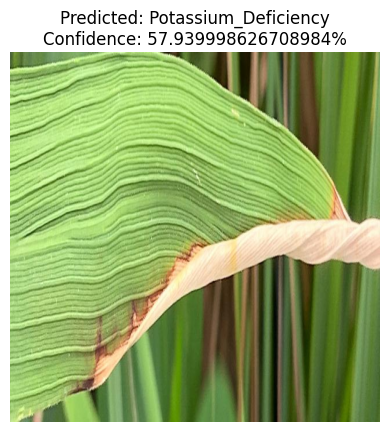

Image: K_7.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 57.939998626708984%
Precaution: No information available.
--------------------------------------------------


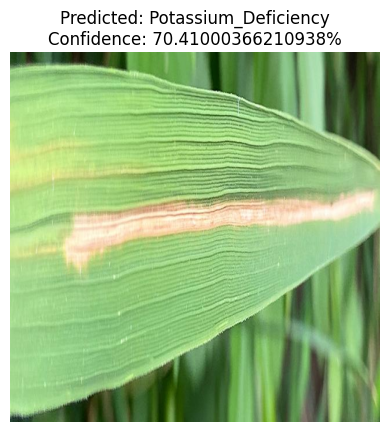

Image: K_8.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 70.41000366210938%
Precaution: No information available.
--------------------------------------------------


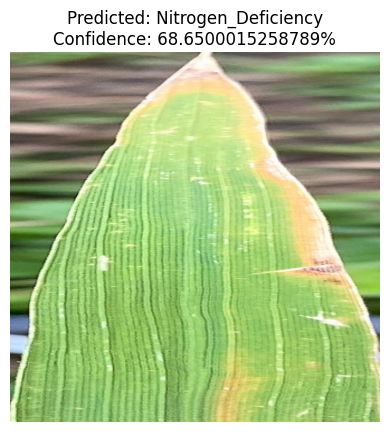

Image: K_9.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 68.6500015258789%
Precaution: No information available.
--------------------------------------------------


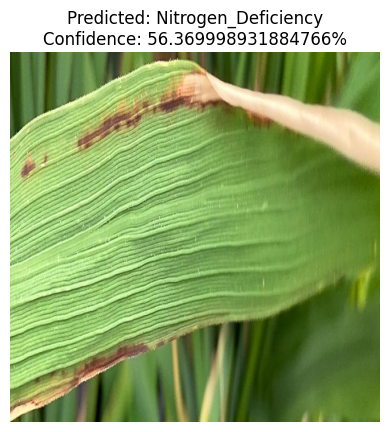

Image: K_10.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 56.369998931884766%
Precaution: No information available.
--------------------------------------------------


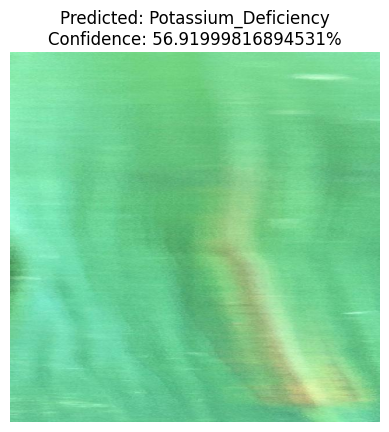

Image: K_11.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 56.91999816894531%
Precaution: No information available.
--------------------------------------------------


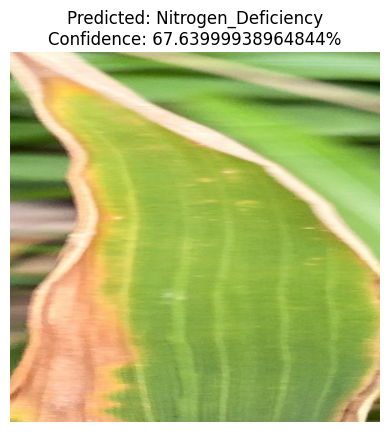

Image: K_12.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 67.63999938964844%
Precaution: No information available.
--------------------------------------------------


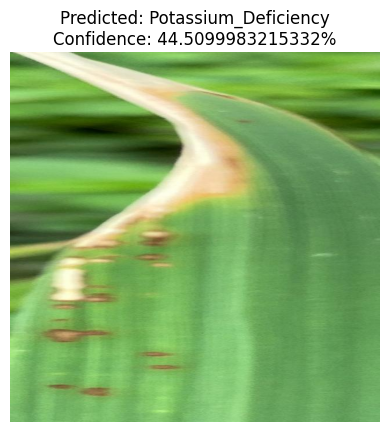

Image: K_13.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 44.5099983215332%
Precaution: No information available.
--------------------------------------------------


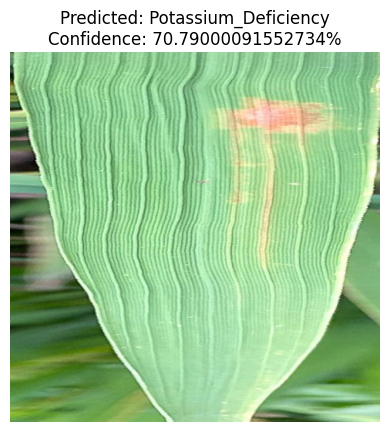

Image: K_14.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 70.79000091552734%
Precaution: No information available.
--------------------------------------------------


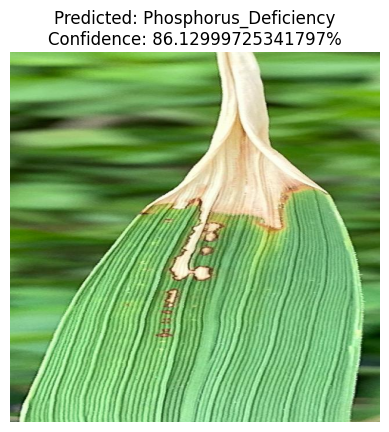

Image: K_15.jpg
Predicted Disease: Phosphorus_Deficiency
Confidence: 86.12999725341797%
Precaution: No information available.
--------------------------------------------------


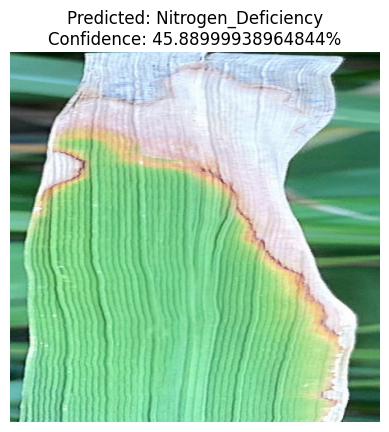

Image: K_16.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 45.88999938964844%
Precaution: No information available.
--------------------------------------------------


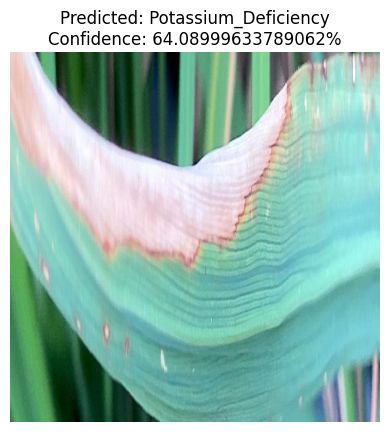

Image: K_17.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 64.08999633789062%
Precaution: No information available.
--------------------------------------------------


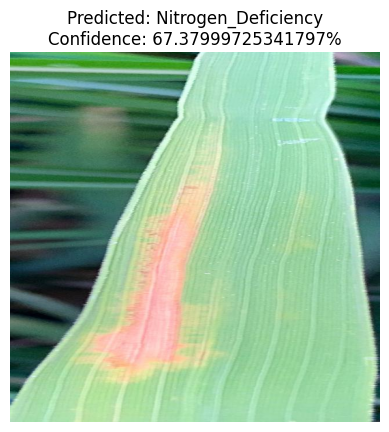

Image: K_18.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 67.37999725341797%
Precaution: No information available.
--------------------------------------------------


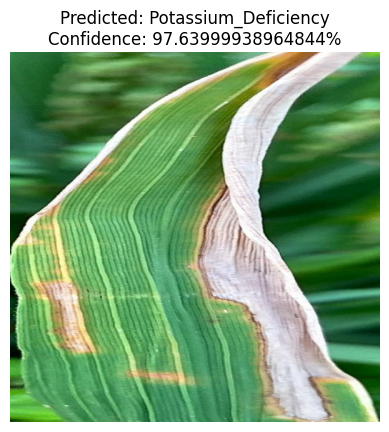

Image: K_19.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 97.63999938964844%
Precaution: No information available.
--------------------------------------------------


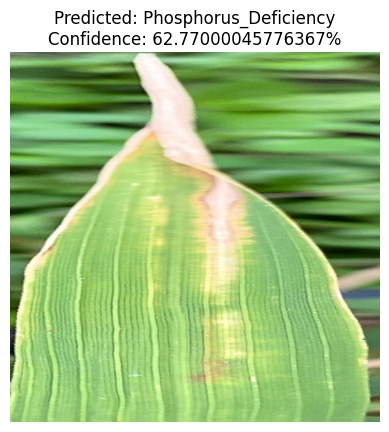

Image: K_20.jpg
Predicted Disease: Phosphorus_Deficiency
Confidence: 62.77000045776367%
Precaution: No information available.
--------------------------------------------------


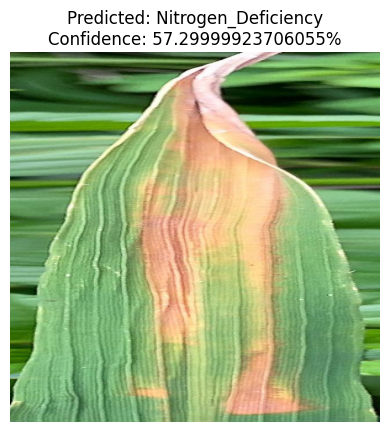

Image: K_21.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 57.29999923706055%
Precaution: No information available.
--------------------------------------------------


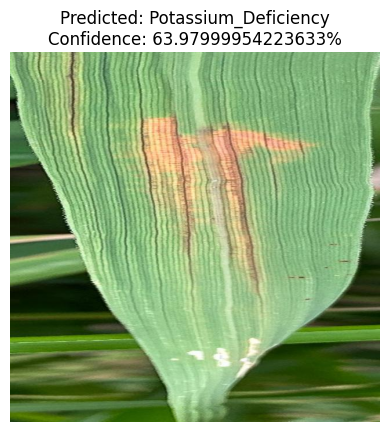

Image: K_22.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 63.97999954223633%
Precaution: No information available.
--------------------------------------------------


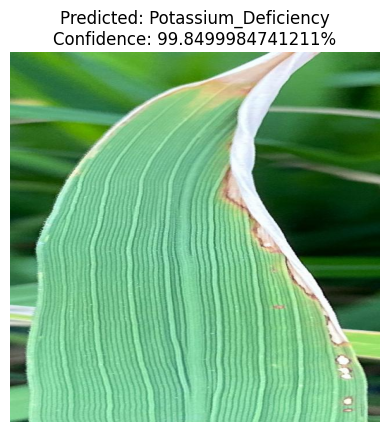

Image: K_23.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 99.8499984741211%
Precaution: No information available.
--------------------------------------------------


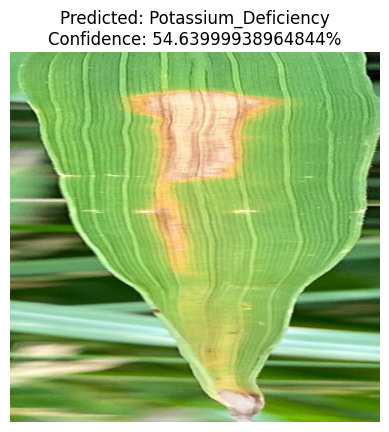

Image: K_24.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 54.63999938964844%
Precaution: No information available.
--------------------------------------------------


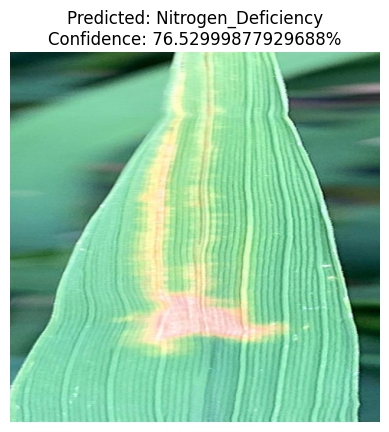

Image: K_25.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 76.52999877929688%
Precaution: No information available.
--------------------------------------------------


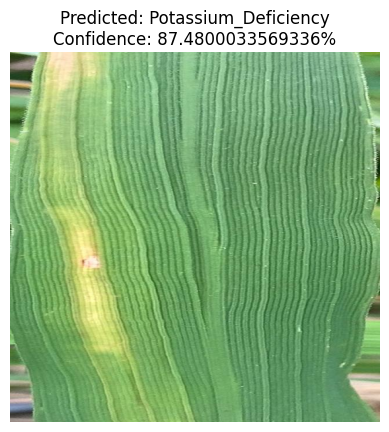

Image: K_26.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 87.4800033569336%
Precaution: No information available.
--------------------------------------------------


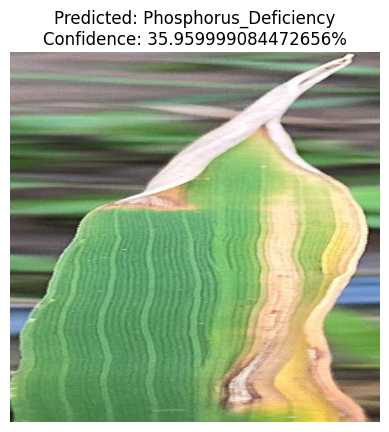

Image: K_27.jpg
Predicted Disease: Phosphorus_Deficiency
Confidence: 35.959999084472656%
Precaution: No information available.
--------------------------------------------------


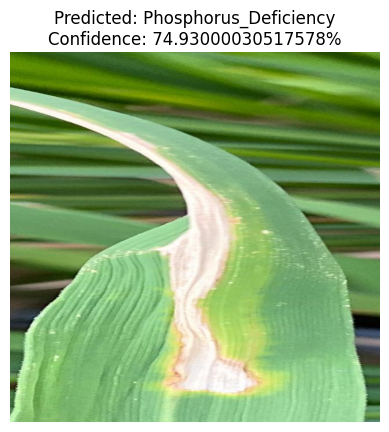

Image: K_28.jpg
Predicted Disease: Phosphorus_Deficiency
Confidence: 74.93000030517578%
Precaution: No information available.
--------------------------------------------------


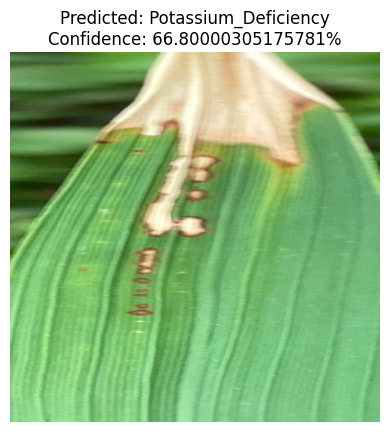

Image: K_29.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 66.80000305175781%
Precaution: No information available.
--------------------------------------------------


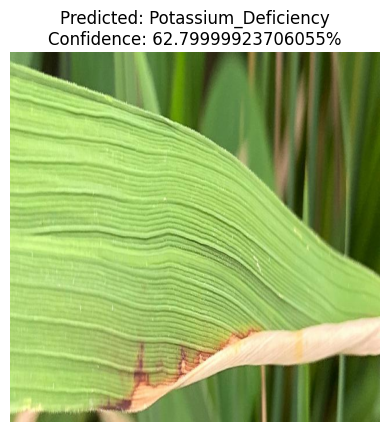

Image: K_30.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 62.79999923706055%
Precaution: No information available.
--------------------------------------------------


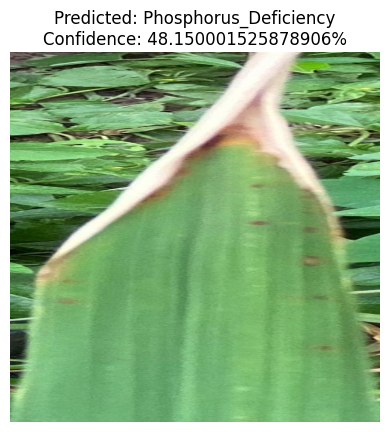

Image: K_31.jpg
Predicted Disease: Phosphorus_Deficiency
Confidence: 48.150001525878906%
Precaution: No information available.
--------------------------------------------------


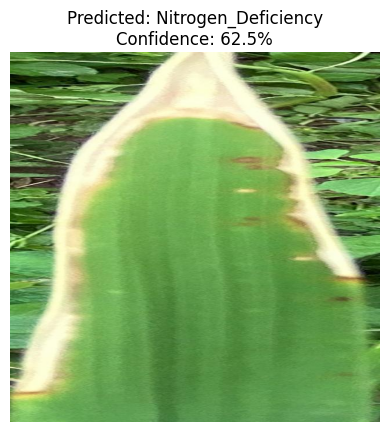

Image: K_32.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 62.5%
Precaution: No information available.
--------------------------------------------------


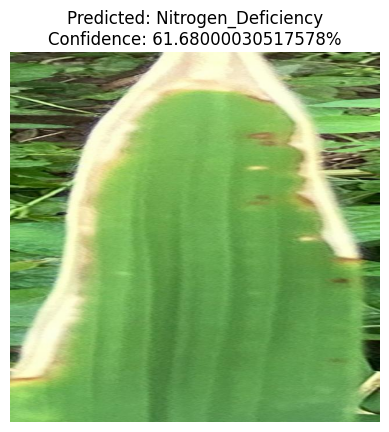

Image: K_33.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 61.68000030517578%
Precaution: No information available.
--------------------------------------------------


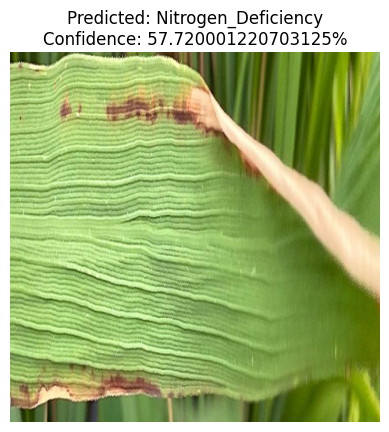

Image: K_34.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 57.720001220703125%
Precaution: No information available.
--------------------------------------------------


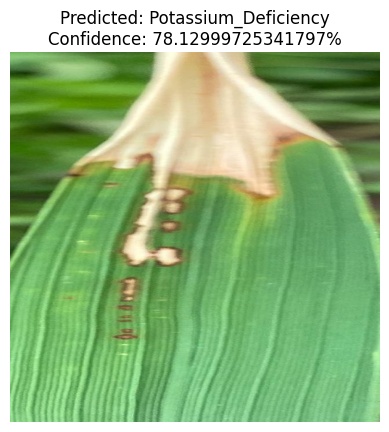

Image: K_35.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 78.12999725341797%
Precaution: No information available.
--------------------------------------------------


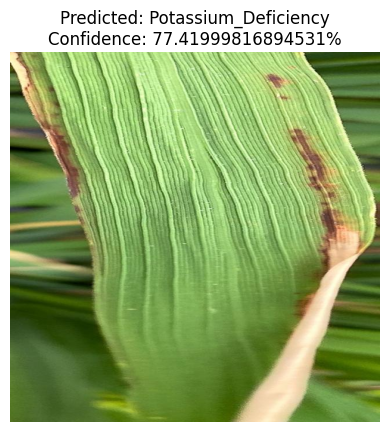

Image: K_36.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 77.41999816894531%
Precaution: No information available.
--------------------------------------------------


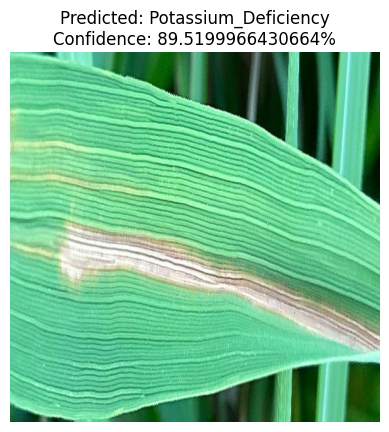

Image: K_37.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 89.5199966430664%
Precaution: No information available.
--------------------------------------------------


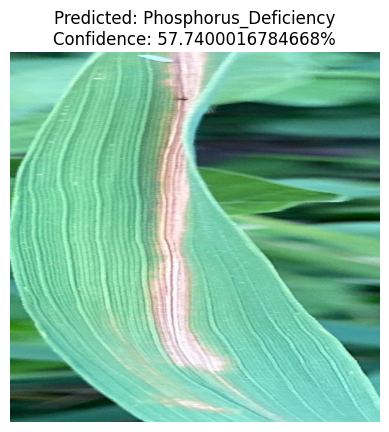

Image: K_38.jpg
Predicted Disease: Phosphorus_Deficiency
Confidence: 57.7400016784668%
Precaution: No information available.
--------------------------------------------------


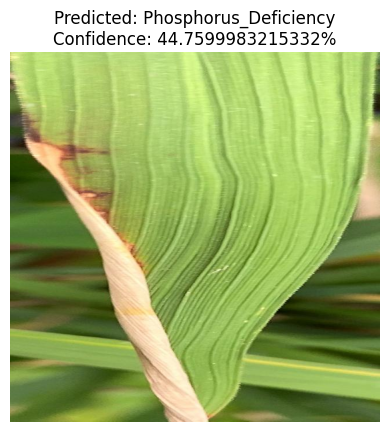

Image: K_39.jpg
Predicted Disease: Phosphorus_Deficiency
Confidence: 44.7599983215332%
Precaution: No information available.
--------------------------------------------------


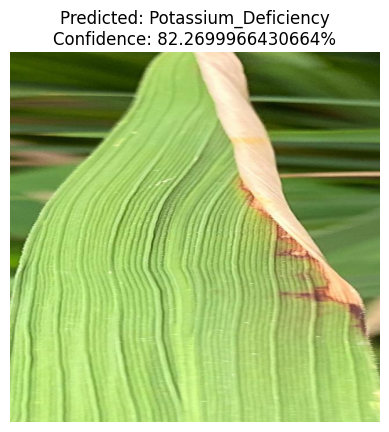

Image: K_40.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 82.2699966430664%
Precaution: No information available.
--------------------------------------------------


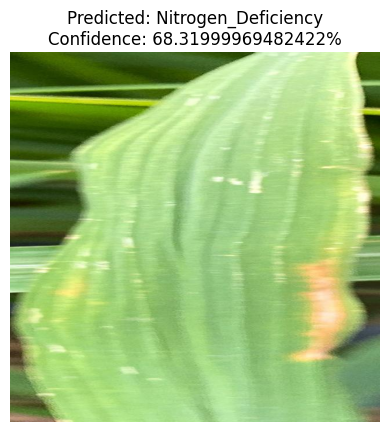

Image: K_41.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 68.31999969482422%
Precaution: No information available.
--------------------------------------------------


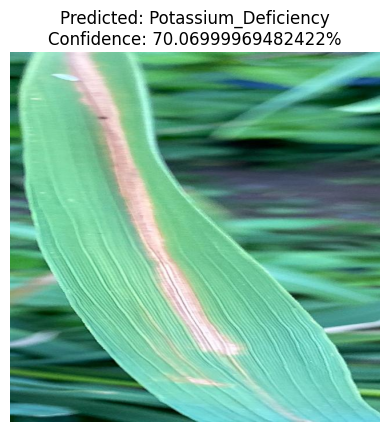

Image: K_42.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 70.06999969482422%
Precaution: No information available.
--------------------------------------------------


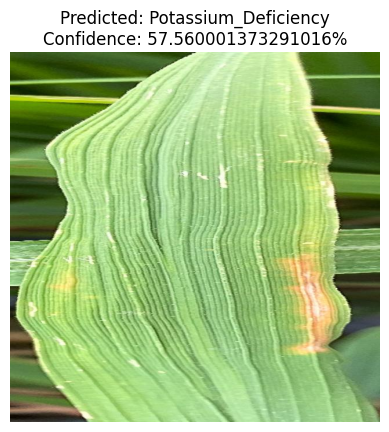

Image: K_43.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 57.560001373291016%
Precaution: No information available.
--------------------------------------------------


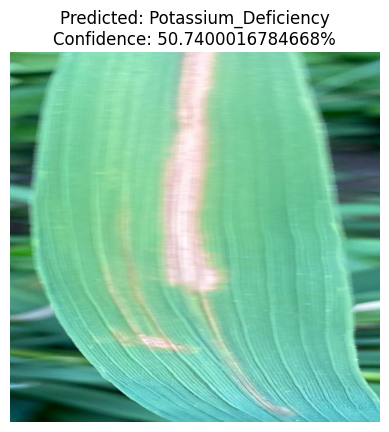

Image: K_44.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 50.7400016784668%
Precaution: No information available.
--------------------------------------------------


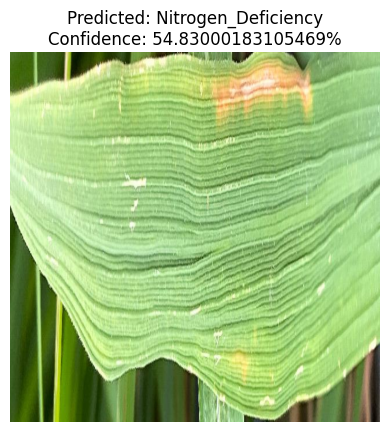

Image: K_45.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 54.83000183105469%
Precaution: No information available.
--------------------------------------------------


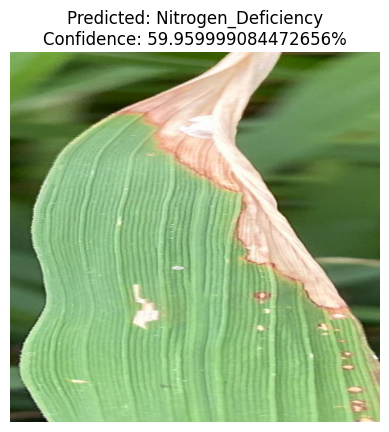

Image: K_46.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 59.959999084472656%
Precaution: No information available.
--------------------------------------------------


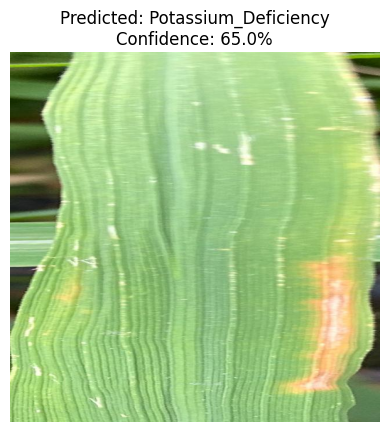

Image: K_47.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 65.0%
Precaution: No information available.
--------------------------------------------------


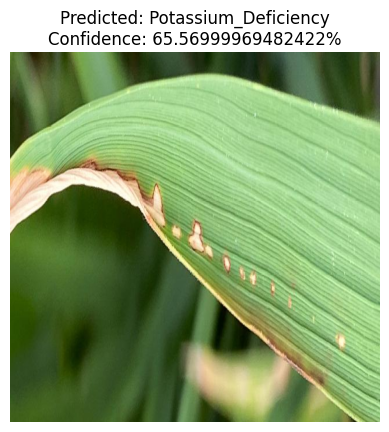

Image: K_48.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 65.56999969482422%
Precaution: No information available.
--------------------------------------------------


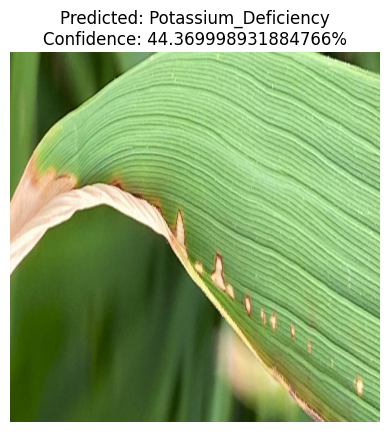

Image: K_49.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 44.369998931884766%
Precaution: No information available.
--------------------------------------------------


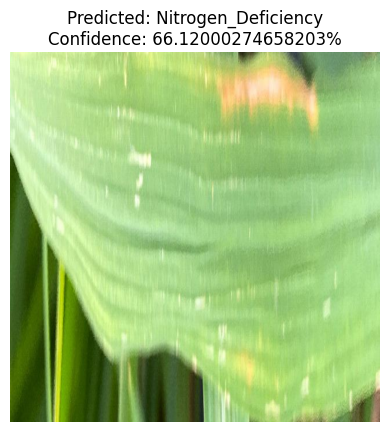

Image: K_50.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 66.12000274658203%
Precaution: No information available.
--------------------------------------------------


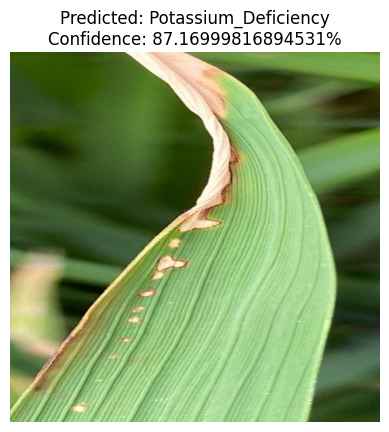

Image: K_51.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 87.16999816894531%
Precaution: No information available.
--------------------------------------------------


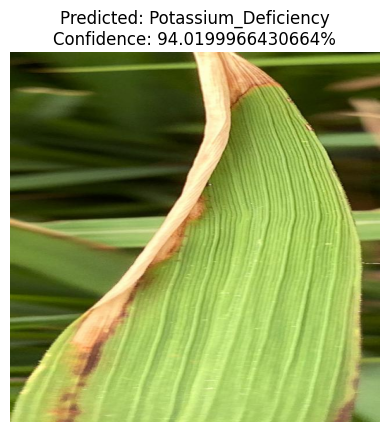

Image: K_52.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 94.0199966430664%
Precaution: No information available.
--------------------------------------------------


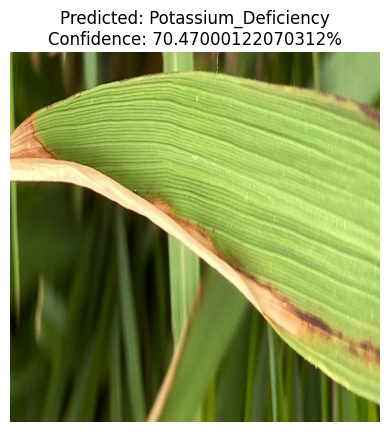

Image: K_53.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 70.47000122070312%
Precaution: No information available.
--------------------------------------------------


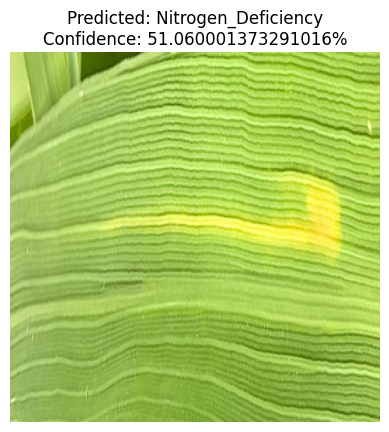

Image: K_54.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 51.060001373291016%
Precaution: No information available.
--------------------------------------------------


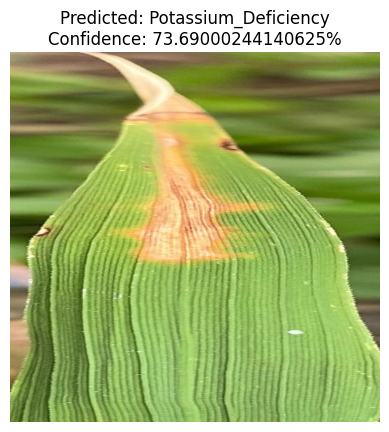

Image: K_55.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 73.69000244140625%
Precaution: No information available.
--------------------------------------------------


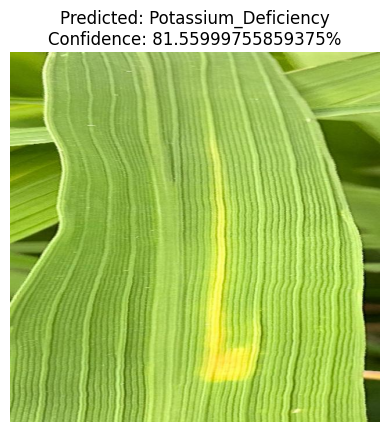

Image: K_56.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 81.55999755859375%
Precaution: No information available.
--------------------------------------------------


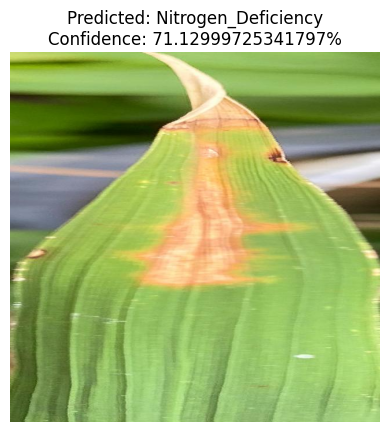

Image: K_57.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 71.12999725341797%
Precaution: No information available.
--------------------------------------------------


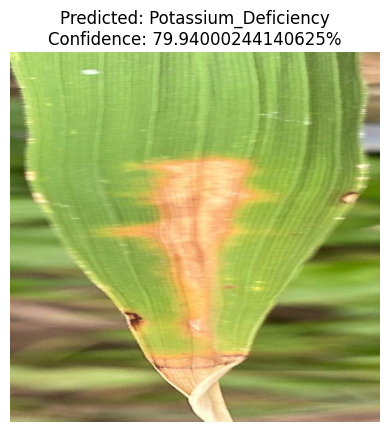

Image: K_58.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 79.94000244140625%
Precaution: No information available.
--------------------------------------------------


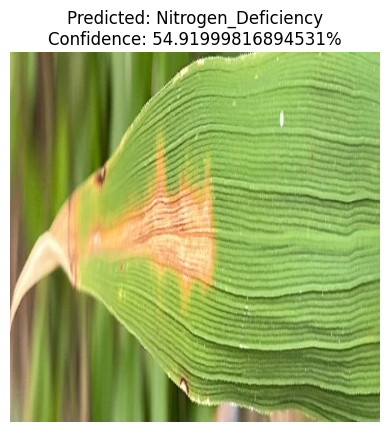

Image: K_59.jpg
Predicted Disease: Nitrogen_Deficiency
Confidence: 54.91999816894531%
Precaution: No information available.
--------------------------------------------------


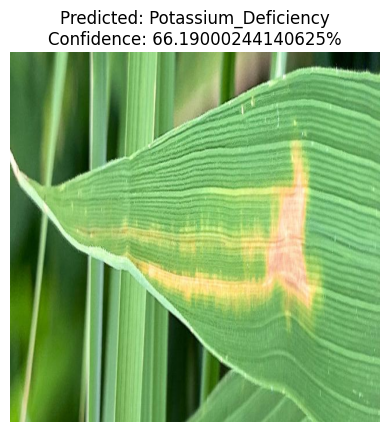

Image: K_60.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 66.19000244140625%
Precaution: No information available.
--------------------------------------------------


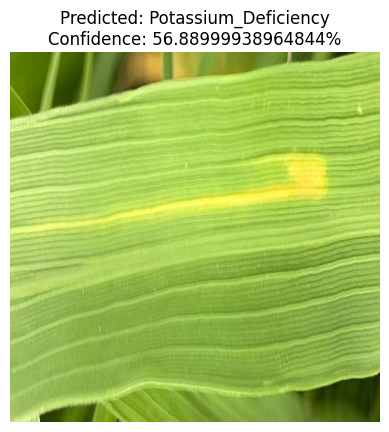

Image: K_61.jpg
Predicted Disease: Potassium_Deficiency
Confidence: 56.88999938964844%
Precaution: No information available.
--------------------------------------------------


In [ ]:
import os
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load the trained model
model_path = "/content/drive/MyDrive/Def_Model.keras"
model = tf.keras.models.load_model(model_path)

class_names = ['Nitrogen_Deficiency', 'Normal','Phosphorus_Deficiency','Potassium_Deficiency']

# Function to preprocess image
def preprocess_image(image_path):
    image = Image.open(image_path)
    image = image.resize((224, 224))  # Resize to model input size
    image = np.array(image) / 255.0  # Normalize pixel values
    return np.expand_dims(image, axis=0)  # Add batch dimension

# Folder containing test images
test_folder = "/content/drive/MyDrive/Paddy_Dataset/Deficiencies/Potassium_Deficiency"  # Change this to your folder path

# Get all image paths in the folder
image_paths = [os.path.join(test_folder, img) for img in os.listdir(test_folder) if img.endswith((".jpg", ".png", ".jpeg"))]

# Loop through each image and make predictions
for image_path in image_paths:
    image = preprocess_image(image_path)
    predictions = model.predict(image, verbose=0)
    predicted_class = np.argmax(predictions)
    confidence = round(100 * np.max(predictions), 2)

    # Display Image
    plt.imshow(Image.open(image_path))
    plt.axis("off")
    plt.title(f"Predicted: {class_names[predicted_class]}\nConfidence: {confidence}%")
    plt.show()

    # Print result and precautions
    print(f"Image: {os.path.basename(image_path)}")
    print(f"Predicted Disease: {class_names[predicted_class]}")
    print(f"Confidence: {confidence}%")
    print(f"Precaution: {precautions_dict.get(class_names[predicted_class], 'No information available.')}")
    print("-" * 50)  # Separator for readability
